
## Background



#### Scientific Community - methods to prevent the spread of disease

#### Government decisions - which measure, what time

#### Rely on epidemiological models - predict and project


#### Multi-agent simulation for infectious diseases using SIIRV Epidemic Model and Vaccination Strategy Analysis with game theory

# Steps

### Generate agent - networkx

<img src="networl.png" style='width:400px; height:200px'>

### state = ['S', 'IM', 'I', 'R'] 
    ### S: Susceptible
    ### IM: Immuned
    ### I: Infectious
    ### R: Recovered

### strategy = ['V', 'NV']
    ### V: Vaccinator
    ### NV: Non-vaccinator

#The below class contains different funtions. First it generated the agents using "agent" function. 
#Then rest all other functions are to calculate the fractions of different states of individuals

In [16]:
import networkx as nx
import numpy as np
import pandas as pd
import random as rnd
import numpy as np
import random as rnd

class Agent:

    def __init__(self):

        
        self.state = 'S'
        self.strategy = 'V'
        self.next_strategy = 'NV'
        self.payoff = 0
        self.neighbors_id = None

    def agents(num_agent, average_degree):
        network = nx.barabasi_albert_graph(num_agent, average_degree//2)
        agents = [Agent() for agent_id in range(num_agent)]

        for agent_id, agent in enumerate(agents):
            agent.neighbors_id = list(network[agent_id])

        return agents

    def count_state_fraction(agents):


        fs  = len([agent for agent in agents if agent.state =='S'])/len(agents)
        fim = len([agent for agent in agents if agent.state =='IM'])/len(agents)
        fi  = len([agent for agent in agents if agent.state =='I'])/len(agents)
        fr  = 1 - fs - fim - fi

        return fs, fim, fi, fr
 

    def count_num_i(agents):


        num_i = len([agent for agent in agents if agent.state == 'I'])

        return num_i
    
    def count_num_s(agents):


        num_s = len([agent for agent in agents if agent.state == 'S'])

        return num_s    
    
    def count_num_v(agents):


        num_nv = len([agent for agent in agents if agent.strategy == 'V'])

        return num_v    

    def count_fv(agents):


        fv = len([agent for agent in agents if agent.strategy == 'V'])/len(agents)

        return fv

    def count_num_nv(agents):


        num_nv = len([agent for agent in agents if agent.strategy == 'NV'])

        return num_nv

    def count_sap(agents):
        sap = np.mean([agent.payoff for agent in agents])

        return sap

### Initializing the states



### Define the functions that define the transmission of the diseases.

####  1) If i in suceptible - check for infected neighbour (beta)
#### 2) If i in good health- immuned (effectiveness)
#### 3) If i is infected state  transformed to recovered (gamma)
#### 4) I decides the vaccination stategy (V or NV)




#### Payoff

<img src="payoff.png" style='width:500px; height:200px'>


#below function initialises the stes and gives the cost of vaccination and cost of infection and effectiveness value

In [17]:
def initializing_state(agents, Cv, effectiveness, num_initial_infected_agents=5):
    


    non_vaccinators_id = [agent_id for agent_id, agent in enumerate(agents) if agent.strategy == 'NV']
    initial_infected_agent_id  = rnd.sample(non_vaccinators_id, k = num_initial_infected_agents)

    for i, agent in enumerate(agents):
        if i in initial_infected_agent_id:
            agent.state = 'I'
            agent.payoff = -1

        elif agent.strategy == 'V':
            agent.payoff = -Cv
            if rnd.random() <= effectiveness:
                agent.state = 'IM'
            else:
                agent.state = 'S'

        else:
            agent.state = 'S'
            agent.payoff = 0




#diease spreding function will include the number of agents and allow the transmormation of agents from one state to another by the strategy.

In [ ]:
def disease_spread(agents, beta, gamma):
   

    for day in range(1, 100000):

        state_changeable_agents = [agent for agent in agents if agent.state in ['S', 'I']]
        next_states = ['S' for i in range(len(state_changeable_agents))]

        for i, agent in enumerate(state_changeable_agents):
            if agent.state == 'S':
                num_infected_neighbors = len([agents[agent_id] for agent_id in agent.neighbors_id if agents[agent_id].state == 'I'])
                if rnd.random() <= beta*num_infected_neighbors:
                    next_states[i] = 'I'
                    agent.payoff -= 1
                else:
                    pass

            elif agent.state == 'I':
                if rnd.random() <= gamma:
                    next_states[i] = 'R'
                else:
                    next_states[i] = 'I'


        for agent, next_state in zip(state_changeable_agents, next_states):
            agent.state = next_state


        fs, fim, fi, fr = Agent.count_state_fraction(agents)

        num_i = Agent.count_num_i(state_changeable_agents)
        print(f'Day: {day}, Fs: {fs:.2f}, Fim: {fim:.2f}, Fi: {fi:.2f}, Fr: {fr:.2f}')

        if num_i == 0:
            print('Disease spreading finished!')
            break

    return fs, fim, fi, fr

### Decision

#### Cv  ranges from 0 to 1
#### Half of all agents vaccinated
#### Decide whether to vaccinate in the next season
#### Pairwise-femi is used to determine the strategy

In [ ]:
def initial_vaccinators(num_agent):

    initial_vaccinators_id = rnd.sample(range(num_agent), k = num_agent//2)

    return initial_vaccinators_id

def initialize_strategy(agents, initial_vaccinators_id):

    for i, agent in enumerate(agents):
        if i in initial_vaccinators_id:
            agent.strategy = 'V'
        else:
            agent.strategy = 'NV'

### PW_Femi

#### Individual 𝑖 wants to update its strategy, randomly chooses neighbor 𝑗. 
#### The probability that the individual 𝑖 will adopt next game is 

<img src="femi.png" style='width:500px; height:200px'>

In [18]:


def PW_Fermi(agents):

    kappa = 0.1  # Thermal coefficient
    next_strategies = [agent.strategy for agent in agents]

    for i, focal in enumerate(agents):
        opponent_id = rnd.choice(focal.neighbors_id)
        opponent = agents[opponent_id]
        if opponent.strategy != focal.strategy and rnd.random() <= 1/(1+np.exp((focal.payoff-opponent.payoff)/kappa)):
            next_strategies[i] = opponent.strategy
        else:
            pass

    for agent, next_strategy in zip(agents, next_strategies):
        agent.strategy = next_strategy

### parameters




In [20]:
def main():
    num_agent = 10000                      # Number of agent
    average_degree = 8                     # average degree of the social network
    beta = 0.49                            # Infection probability
    gamma = 0.63                           # Recovery probability

    params_range = np.arange(0, 1.1, 0.1)   #vaccine cost range from 0 to 1 
    time_step = 1000
    num_initial_infected_agents = 5

   
    agents = Agent.agents(num_agent, average_degree)
    output1 = pd.DataFrame({'Cv': [],
                           'Effectiveness': [],
                           'FES': [],
                           'VC': [],
                           'SAP': []
                          })
    
    
    output2 = pd.DataFrame({'time_step': [],
                           'fs': [],
                           'fim': [],
                           'fi': [],
                           'fr': [],
                           'Cv': []
                          })

    

    rnd.seed()
    initial_vaccinators_id = initial_vaccinators(num_agent)

    for Cv in params_range:
        #effectiveness : indicates the probability that the vaccine actually works
        for effectiveness in params_range:
            initialize_strategy(agents, initial_vaccinators_id)
            initial_fv = Agent.count_fv(agents)
            fv_hist = [initial_fv]
            fes_hist = []
            sap_hist = []

            for season in range(1, time_step+1):
                print(f'Cv: {Cv:.1f}, Effectiveness: {effectiveness:.1f}, Season: {season} starts...') 

                initializing_state(agents, Cv, effectiveness)
               
                fs, fim, fi, fr = disease_spread(agents, beta, gamma)
      
                PW_Fermi(agents)

                
                fv = Agent.count_fv(agents)
                num_nv = Agent.count_num_nv(agents)
                sap = Agent.count_sap(agents)
                

                fes_hist.append(fr)
                fv_hist.append(fv)
                sap_hist.append(sap)

               
                if num_nv <= num_initial_infected_agents:
                    fes_eq = fr
                    fv_eq = fv_hist[-2] 
                    sap_eq = sap
                    break

                elif (season >= 150 and np.mean(fv_hist[season-100:season-1]) - fv <= 0.001) or season == time_step:
                    fes_eq = np.mean(fes_hist[season-100:season-1])
                    fv_eq = np.mean(fv_hist[season-99:season])  
                    sap_eq = np.mean(sap_hist[season-100:season-1])
                    break

            new_output1 = pd.DataFrame([[format(Cv, '.1f'), format(effectiveness, '.1f'), fes_eq, fv_eq, sap_eq]], columns = ['Cv', 'Effectiveness', 'FES', 'VC', 'SAP'])
            output1 = output1.append(new_output1)
            print(f'Cv: {Cv:.1f}, Effectiveness: {effectiveness:.1f}, Season finished with FES: {fes_eq:.2f}, VC: {fv_eq:.2f}, SAP: {sap_eq:.2f}')
            new_output2= pd.DataFrame([[format(Cv, '.1f'), time_step, fs, fim, fi,fr]], columns = ['Cv', 'time_step', 'fs', 'fim', 'fi', 'fr'])
            output2 = output2.append(new_output2)
            
            
            
            
    output1.to_csv(f'output1.csv')
    output2.to_csv(f'output2.csv')

if __name__=='__main__':
    main()

Cv: 0.0, Effectiveness: 0.0, Season: 1 starts...
Day: 1, Fs: 1.00, Fim: 0.00, Fi: 0.00, Fr: 0.00
Day: 2, Fs: 0.97, Fim: 0.00, Fi: 0.03, Fr: 0.00
Day: 3, Fs: 0.75, Fim: 0.00, Fi: 0.22, Fr: 0.02
Day: 4, Fs: 0.24, Fim: 0.00, Fi: 0.60, Fr: 0.16
Day: 5, Fs: 0.02, Fim: 0.00, Fi: 0.45, Fr: 0.54
Day: 6, Fs: 0.00, Fim: 0.00, Fi: 0.18, Fr: 0.81
Day: 7, Fs: 0.00, Fim: 0.00, Fi: 0.07, Fr: 0.93
Day: 8, Fs: 0.00, Fim: 0.00, Fi: 0.02, Fr: 0.97
Day: 9, Fs: 0.00, Fim: 0.00, Fi: 0.01, Fr: 0.99
Day: 10, Fs: 0.00, Fim: 0.00, Fi: 0.00, Fr: 0.99
Day: 11, Fs: 0.00, Fim: 0.00, Fi: 0.00, Fr: 1.00
Day: 12, Fs: 0.00, Fim: 0.00, Fi: 0.00, Fr: 1.00
Day: 13, Fs: 0.00, Fim: 0.00, Fi: 0.00, Fr: 1.00
Day: 14, Fs: 0.00, Fim: 0.00, Fi: 0.00, Fr: 1.00
Disease spreading finished!
Cv: 0.0, Effectiveness: 0.0, Season: 2 starts...
Day: 1, Fs: 1.00, Fim: 0.00, Fi: 0.00, Fr: 0.00
Day: 2, Fs: 0.99, Fim: 0.00, Fi: 0.01, Fr: 0.00
Day: 3, Fs: 0.94, Fim: 0.00, Fi: 0.06, Fr: 0.01
Day: 4, Fs: 0.61, Fim: 0.00, Fi: 0.35, Fr: 0.04
Day: 

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

C:\Users\12035_\Anaconda3\lib\site-packages\numpy\_distributor_init.py:32: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\12035_\Anaconda3\lib\site-packages\numpy\.libs\libopenblas.PYQHXLVVQ7VESDPUVUADXEVJOBGHJPAY.gfortran-win_amd64.dll
C:\Users\12035_\Anaconda3\lib\site-packages\numpy\.libs\libopenblas.WCDJNK7YVMPZQ2ME2ZZHJJRJ3JIKNDB7.gfortran-win_amd64.dll
  stacklevel=1)


## Plots

In [104]:
import matplotlib.pyplot as plt
import pandas as pd
 

In [115]:
df = pd.read_csv('Covid_values.csv') 

In [116]:
zero = df[df["Cv"]==0]
one = df[df["Cv"]==0.1]
two = df[df["Cv"]==0.2]
three = df[df["Cv"]==0.3]
four = df[df["Cv"]==0.4]
five = df[df["Cv"]==0.5]
six = df[df["Cv"]==0.6]
seven = df[df["Cv"]==0.7]
eight = df[df["Cv"]==0.8]
nine = df[df["Cv"]==0.9]
ten = df[df["Cv"]==1]


In [111]:
x0=zero['Effectiveness']
x1=one['Effectiveness']
x2=two['Effectiveness']
x3=three['Effectiveness']
x4=four['Effectiveness']
x5=five['Effectiveness']
x6=six['Effectiveness']
x7=seven['Effectiveness']
x8=eight['Effectiveness']
x9=nine['Effectiveness']
x10=ten['Effectiveness']

In [112]:
y0=zero['FES']
y1=one['FES']
y2=two['FES']
y3=three['FES']
y4=four['FES']
y5=five['FES']
y6=six['FES']
y7=seven['FES']
y8=eight['FES']
y9=nine['FES']
y10=ten['FES']


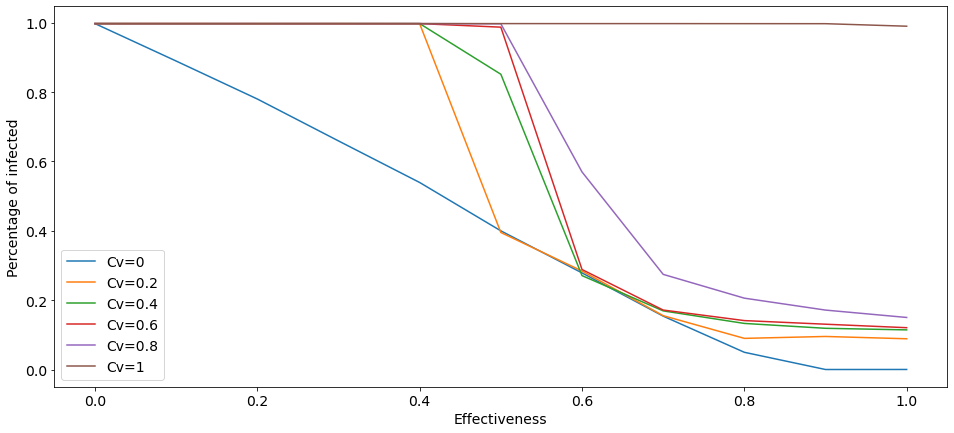

In [99]:
# plotting the points 
plt.plot(x0, y0, label='Cv=0')
#plt.plot(x1, y1, label='Cv=1')
plt.plot(x2, y2, label='Cv=0.2')
#plt.plot(x3, y3, label='Cv=3')
plt.plot(x4, y4, label='Cv=0.4')
#plt.plot(x5, y5, label='Cv=5')
plt.plot(x6, y6, label='Cv=0.6')
#plt.plot(x7, y7, label='Cv=7')
plt.plot(x8, y8, label='Cv=0.8')
#plt.plot(x0, y0, label='Cv=0')
plt.plot(x10, y10, label='Cv=1')
plt.xlabel('Effectiveness')
# Set the y axis label of the current axis.
plt.ylabel('Percentage of infected')

plt.legend()
plt.show()



In [100]:
x0=zero['Effectiveness']
x1=one['Effectiveness']
x2=two['Effectiveness']
x3=three['Effectiveness']
x4=four['Effectiveness']
x5=five['Effectiveness']
x6=six['Effectiveness']
x7=seven['Effectiveness']
x8=eight['Effectiveness']
x9=nine['Effectiveness']
x10=ten['Effectiveness']

In [101]:
y0=zero['VC']
y1=one['VC']
y2=two['VC']
y3=three['VC']
y4=four['VC']
y5=five['VC']
y6=six['VC']
y7=seven['VC']
y8=eight['VC']
y9=nine['VC']
y10=ten['VC']


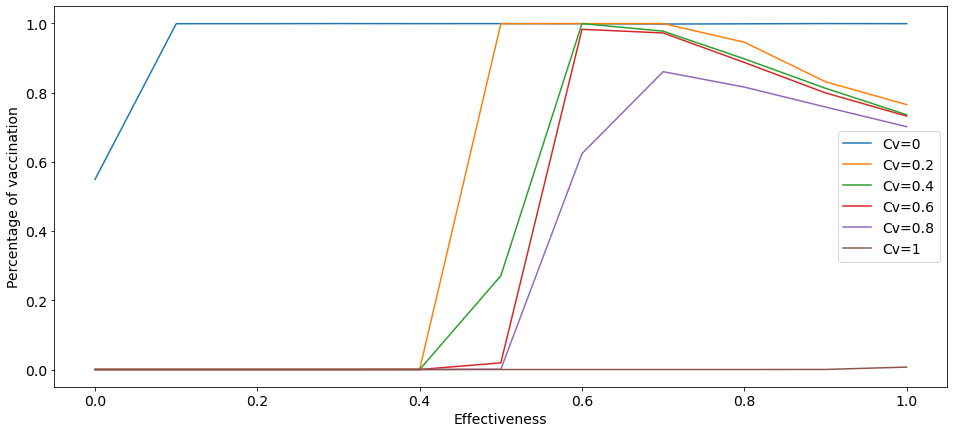

In [103]:
# plotting the points 
plt.plot(x0, y0, label='Cv=0')
#plt.plot(x1, y1, label='Cv=1')
plt.plot(x2, y2, label='Cv=0.2')
#plt.plot(x3, y3, label='Cv=3')
plt.plot(x4, y4, label='Cv=0.4')
#plt.plot(x5, y5, label='Cv=5')
plt.plot(x6, y6, label='Cv=0.6')
#plt.plot(x7, y7, label='Cv=7')
plt.plot(x8, y8, label='Cv=0.8')
#plt.plot(x0, y0, label='Cv=0')
plt.plot(x10, y10, label='Cv=1')
plt.xlabel('Effectiveness')
# Set the y axis label of the current axis.
plt.ylabel('Percentage of vaccination')

plt.legend()
plt.show()



In [117]:
zero = df[df["Cv"]==0]
one = df[df["Cv"]==0.1]
two = df[df["Cv"]==0.2]
three = df[df["Cv"]==0.3]
four = df[df["Cv"]==0.4]
five = df[df["Cv"]==0.5]
six = df[df["Cv"]==0.6]
seven = df[df["Cv"]==0.7]
eight = df[df["Cv"]==0.8]
nine = df[df["Cv"]==0.9]
ten = df[df["Cv"]==1]


In [121]:
x0=zero['time']
x1=one['time']
x2=two['time']
x3=three['time']
x4=four['time']
x5=five['time']
x6=six['time']
x7=seven['time']
x8=eight['time']
x9=nine['time']
x10=ten['time']


In [122]:
y0=zero['fs']
y1=one['fs']
y2=two['fs']
y3=three['fs']
y4=four['fs']
y5=five['fs']
y6=six['fs']
y7=seven['fs']
y8=eight['fs']
y9=nine['fs']
y10=ten['fs']


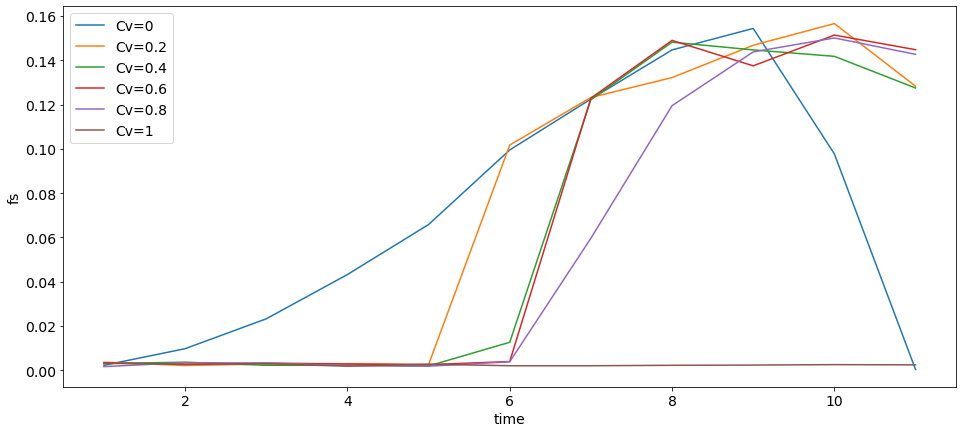

In [124]:
# plotting the points 
plt.plot(x0, y0, label='Cv=0')
#plt.plot(x1, y1, label='Cv=1')
plt.plot(x2, y2, label='Cv=0.2')
#plt.plot(x3, y3, label='Cv=3')
plt.plot(x4, y4, label='Cv=0.4')
#plt.plot(x5, y5, label='Cv=5')
plt.plot(x6, y6, label='Cv=0.6')
#plt.plot(x7, y7, label='Cv=7')
plt.plot(x8, y8, label='Cv=0.8')
#plt.plot(x0, y0, label='Cv=0')
plt.plot(x10, y10, label='Cv=1')
plt.xlabel('time')
# Set the y axis label of the current axis.
plt.ylabel('fs')

plt.legend()
plt.show()



In [125]:
y0=zero['fim']
y1=one['fim']
y2=two['fim']
y3=three['fim']
y4=four['fim']
y5=five['fim']
y6=six['fim']
y7=seven['fim']
y8=eight['fim']
y9=nine['fim']
y10=ten['fim']


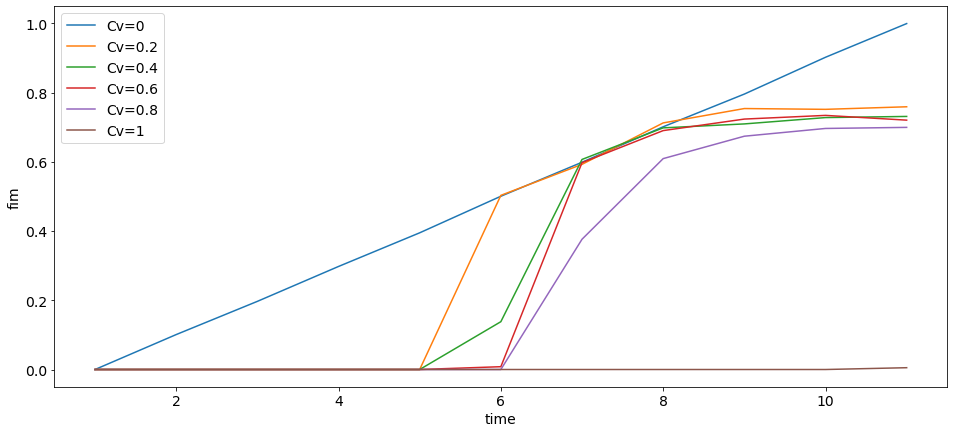

In [126]:
# plotting the points 
plt.plot(x0, y0, label='Cv=0')
#plt.plot(x1, y1, label='Cv=1')
plt.plot(x2, y2, label='Cv=0.2')
#plt.plot(x3, y3, label='Cv=3')
plt.plot(x4, y4, label='Cv=0.4')
#plt.plot(x5, y5, label='Cv=5')
plt.plot(x6, y6, label='Cv=0.6')
#plt.plot(x7, y7, label='Cv=7')
plt.plot(x8, y8, label='Cv=0.8')
#plt.plot(x0, y0, label='Cv=0')
plt.plot(x10, y10, label='Cv=1')
plt.xlabel('time')
# Set the y axis label of the current axis.
plt.ylabel('fim')

plt.legend()
plt.show()



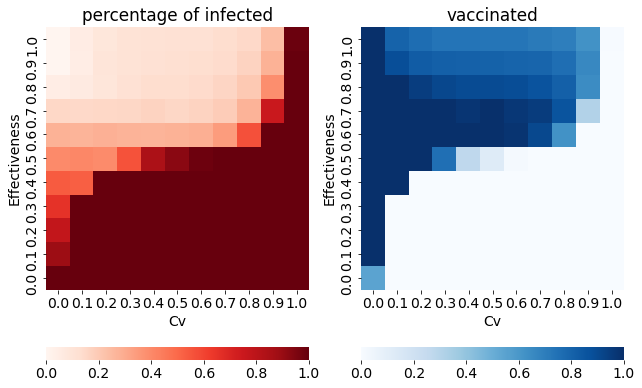

In [3]:
plt.rcParams['figure.figsize'] = 16, 7
plt.rcParams['font.size'] = 14
df = pd.read_csv('Covid_values.csv') 

pivot1 = df.pivot('Effectiveness', 'Cv', 'FES')
pivot2 = df.pivot('Effectiveness', 'Cv', 'VC')

fig = plt.figure()

ax1 = fig.add_subplot(131)
sns.heatmap(pivot1, cmap='Reds', vmin = 0, vmax = 1.0, square=True, annot=False, cbar_kws={"orientation": "horizontal"})
ax1.set_title('percentage of infected')
plt.gca().invert_yaxis()

ax2 = fig.add_subplot(132)
sns.heatmap(pivot2, cmap='Blues', vmin = 0, vmax = 1.0, square=True, annot=False, cbar_kws={"orientation": "horizontal"})
ax2.set_title('vaccinated')
plt.gca().invert_yaxis()


#  

# Summary and Recommondation

1) Agent based SIRV
2) Vacine/not vaccine
3) Femi update policy

1) Cost of the vaccine
2) Spread the awareness - Imitate the behavior
3) Discount in the cost of vaccine

